In [6]:
import os
from gpt2 import GPT, GPTConfig
from eval import evaluate, get_hellaswag

import tiktoken


root = "/root/.cache/huggingface/hub/models--Laz4rz--GPT-2/snapshots/7b11ebd22a44a487bda59e6c29d2ae144513a268/"
names = sorted(list(os.walk(root))[0][-1], key=lambda x: int(x.split("_")[-1].split(".")[0]))
results = {}
for name in names:
    model = GPT.from_pretrained(root+name, local=True, return_dict=True)
    enc = tiktoken.get_encoding("gpt2")

    # ds = get_belebele("eng_Latn")
    ds = get_hellaswag("validation")

    acc = evaluate(model, "cuda", ds, return_acc=True)
    results[name] = acc

Loading GPT-2 model weights from local file: /root/.cache/huggingface/hub/models--Laz4rz--GPT-2/snapshots/7b11ebd22a44a487bda59e6c29d2ae144513a268/model_0.pth


return dict: True
1 acc_norm: 0/1=0.0000, acc: 0.0000 -- pred: 1, label: 3
---
Context:
 A man is sitting on a roof. he
Endings:
0 (loss: 10.7806) is using wrap to wrap a pair of skis.
1 (loss: 10.9270) is ripping level tiles off.
2 (loss: 10.8580) is holding a rubik's cube.
3 (loss: 10.8983) starts pulling up roofing on a roof.
predicted: 0, actual: 3
2 acc_norm: 0/2=0.0000, acc: 0.0000 -- pred: 1, label: 3
---
Context:
 A lady walks to a barbell. She bends down and grabs the pole. the lady
Endings:
0 (loss: 10.9791) swings and lands in her arms.
1 (loss: 10.9216) pulls the barbell forward.
2 (loss: 11.0236) pulls a rope attached to the barbell.
3 (loss: 10.9688) stands and lifts the weight over her head.
predicted: 1, actual: 3
3 acc_norm: 0/3=0.0000, acc: 0.3333 -- pred: 2, label: 2
---
Context:
 Two women in a child are shown in a canoe while a man pulls the canoe while standing in the water, with other individuals visible in the background. the child and a different man
Endings:
0

In [20]:
results

{'model_0.pth': 0.24785899223262298,
 'model_10.pth': 0.25652260505875324,
 'model_1000.pth': 0.25343557060346544,
 'model_2000.pth': 0.25941047600079664,
 'model_3000.pth': 0.2608046205935073,
 'model_4000.pth': 0.2688707428799044,
 'model_5000.pth': 0.2689703246365266,
 'model_6000.pth': 0.26857199761003786,
 'model_7000.pth': 0.27504481179047996,
 'model_8000.pth': 0.2740489942242581,
 'model_9000.pth': 0.2795259908384784,
 'model_10000.pth': 0.28271260705038836,
 'model_11000.pth': 0.2853017327225652,
 'model_12000.pth': 0.28141804421429994,
 'model_13000.pth': 0.28759211312487554,
 'model_14000.pth': 0.2892850029874527,
 'model_15000.pth': 0.29038040231029677,
 'model_16000.pth': 0.28818960366460866,
 'model_17000.pth': 0.2892850029874527,
 'model_18000.pth': 0.29177454690300736,
 'model_19000.pth': 0.29286994622585144,
 'model_19702.pth': 0.291575383389763}

Text(0.5, 1.0, 'Hellaswag validation score')

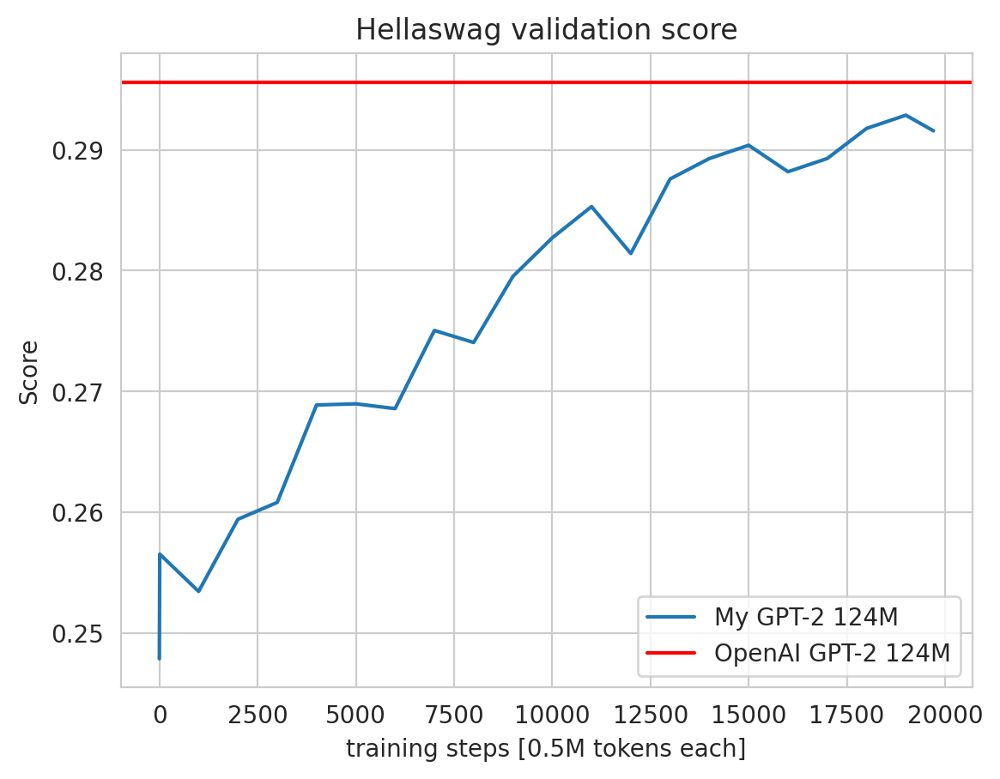

In [35]:
import matplotlib.pyplot as plt
import seaborn

seaborn.set_style("whitegrid")

plt.figure(dpi=200)

x = [int(n.split("_")[-1].split(".")[0]) for n in names]
y = list(results.values())
plt.plot(x, y)
plt.axhline(0.2956, color="r")

plt.legend(["My GPT-2 124M", "OpenAI GPT-2 124M"])
plt.xlabel("training steps [0.5M tokens each]")
plt.ylabel("Score")
plt.title("Hellaswag validation score")